# Style Transfer

Style transfer technique from "[A Neural Algorithm of Artistic Style](http://arxiv.org/abs/1508.06576)".

## Setup

In [1]:
import os
import sys
import numpy as np
import scipy.io
import scipy.misc
import tensorflow as tf  # Import TensorFlow after Scipy or Scipy will break
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
%matplotlib inline

### Model

We need to take the advatange of a CNN structure which (implicitly) understands image contents and styles. Rather than training a completely new model from scratch, we will use a pre-trained model to achieve our purpose - called "transfer learning".

We will use the VGG19 model. Since the model itself is very large (>500Mb) you will need to download the [VGG-19 model](http://www.vlfeat.org/matconvnet/models/imagenet-vgg-verydeep-19.mat) and put it under the `model/` folder. The comments below describes the dimensions of the VGG19 model. We will replace the max pooling layers with average pooling layers as the paper suggests, and discard all fully connected layers.

In [2]:
# Pick the VGG 19-layer model by from the paper "Very Deep Convolutional 
# Networks for Large-Scale Image Recognition".
VGG_MODEL = 'model/imagenet-vgg-verydeep-19.mat'

# The mean to subtract from the input to the VGG model. This is the mean that
# when the VGG was used to train. Minor changes to this will make a lot of
# difference to the performance of model.
MEAN_VALUES = np.array([123.68, 116.779, 103.939]).reshape((1,1,3))

def load_vgg_model(path):
    """
    Returns a model for the purpose of 'painting' the picture.
    Takes only the convolution layer weights and wrap using the TensorFlow
    Conv2d, Relu and AveragePooling layer. VGG actually uses maxpool but
    the paper indicates that using AveragePooling yields better results.
    The last few fully connected layers are not used.
    Here is the detailed configuration of the VGG model:
        0 is conv1_1 (3, 3, 3, 64)
        1 is relu
        2 is conv1_2 (3, 3, 64, 64)
        3 is relu    
        4 is maxpool
        5 is conv2_1 (3, 3, 64, 128)
        6 is relu
        7 is conv2_2 (3, 3, 128, 128)
        8 is relu
        9 is maxpool
        10 is conv3_1 (3, 3, 128, 256)
        11 is relu
        12 is conv3_2 (3, 3, 256, 256)
        13 is relu
        14 is conv3_3 (3, 3, 256, 256)
        15 is relu
        16 is conv3_4 (3, 3, 256, 256)
        17 is relu
        18 is maxpool
        19 is conv4_1 (3, 3, 256, 512)
        20 is relu
        21 is conv4_2 (3, 3, 512, 512)
        22 is relu
        23 is conv4_3 (3, 3, 512, 512)
        24 is relu
        25 is conv4_4 (3, 3, 512, 512)
        26 is relu
        27 is maxpool
        28 is conv5_1 (3, 3, 512, 512)
        29 is relu
        30 is conv5_2 (3, 3, 512, 512)
        31 is relu
        32 is conv5_3 (3, 3, 512, 512)
        33 is relu
        34 is conv5_4 (3, 3, 512, 512)
        35 is relu
        36 is maxpool
        37 is fullyconnected (7, 7, 512, 4096)
        38 is relu
        39 is fullyconnected (1, 1, 4096, 4096)
        40 is relu
        41 is fullyconnected (1, 1, 4096, 1000)
        42 is softmax
    """
    vgg = scipy.io.loadmat(path)

    vgg_layers = vgg['layers']
    def _weights(layer, expected_layer_name):
        """
        Return the weights and bias from the VGG model for a given layer.
        """
        W = vgg_layers[0][layer][0][0][2][0][0]
        b = vgg_layers[0][layer][0][0][2][0][1]
        layer_name = vgg_layers[0][layer][0][0][0]
        assert layer_name == expected_layer_name
        return W, b

    def _relu(conv2d_layer):
        """
        Return the RELU function wrapped over a TensorFlow layer. Expects a
        Conv2d layer input.
        """
        return tf.nn.relu(conv2d_layer)

    def _conv2d(prev_layer, layer, layer_name):
        """
        Return the Conv2D layer using the weights, biases from the VGG
        model at 'layer'.
        """
        W, b = _weights(layer, layer_name)
        W = tf.constant(W)
        b = tf.constant(np.reshape(b, (b.size)))
        return tf.nn.conv2d(
            prev_layer, filter=W, strides=[1, 1, 1, 1], padding='SAME') + b

    def _conv2d_relu(prev_layer, layer, layer_name):
        """
        Return the Conv2D + RELU layer using the weights, biases from the VGG
        model at 'layer'.
        """
        return _relu(_conv2d(prev_layer, layer, layer_name))

    def _avgpool(prev_layer):
        """
        Return the AveragePooling layer.
        """
        return tf.nn.avg_pool(prev_layer, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

    # Constructs the graph model.
    graph = {}
    graph['input']   = tf.Variable(np.zeros((1, IMAGE_HEIGHT, IMAGE_WIDTH, COLOR_CHANNELS)), dtype = 'float32')
    graph['conv1_1']  = _conv2d_relu(graph['input'], 0, 'conv1_1')
    graph['conv1_2']  = _conv2d_relu(graph['conv1_1'], 2, 'conv1_2')
    graph['avgpool1'] = _avgpool(graph['conv1_2'])
    graph['conv2_1']  = _conv2d_relu(graph['avgpool1'], 5, 'conv2_1')
    graph['conv2_2']  = _conv2d_relu(graph['conv2_1'], 7, 'conv2_2')
    graph['avgpool2'] = _avgpool(graph['conv2_2'])
    graph['conv3_1']  = _conv2d_relu(graph['avgpool2'], 10, 'conv3_1')
    graph['conv3_2']  = _conv2d_relu(graph['conv3_1'], 12, 'conv3_2')
    graph['conv3_3']  = _conv2d_relu(graph['conv3_2'], 14, 'conv3_3')
    graph['conv3_4']  = _conv2d_relu(graph['conv3_3'], 16, 'conv3_4')
    graph['avgpool3'] = _avgpool(graph['conv3_4'])
    graph['conv4_1']  = _conv2d_relu(graph['avgpool3'], 19, 'conv4_1')
    graph['conv4_2']  = _conv2d_relu(graph['conv4_1'], 21, 'conv4_2')
    graph['conv4_3']  = _conv2d_relu(graph['conv4_2'], 23, 'conv4_3')
    graph['conv4_4']  = _conv2d_relu(graph['conv4_3'], 25, 'conv4_4')
    graph['avgpool4'] = _avgpool(graph['conv4_4'])
    graph['conv5_1']  = _conv2d_relu(graph['avgpool4'], 28, 'conv5_1')
    graph['conv5_2']  = _conv2d_relu(graph['conv5_1'], 30, 'conv5_2')
    graph['conv5_3']  = _conv2d_relu(graph['conv5_2'], 32, 'conv5_3')
    graph['conv5_4']  = _conv2d_relu(graph['conv5_3'], 34, 'conv5_4')
    graph['avgpool5'] = _avgpool(graph['conv5_4'])
    return graph

In [3]:
# Output folder for the images.
OUTPUT_DIR = 'output/'
# Style image to use.
STYLE_IMAGE = 'images/muse.jpg'
# Content image to use.
CONTENT_IMAGE = 'images/trojan_shrine.jpg'
# Image dimensions constants. 
IMAGE_WIDTH = 640
IMAGE_HEIGHT = 480
COLOR_CHANNELS = 3

def load_image(path):
    image_raw = scipy.misc.imread(path)
    # Resize the image for convnet input and add an extra dimension
    image_raw = scipy.misc.imresize(image_raw, (IMAGE_HEIGHT, IMAGE_WIDTH))
    image = image_raw - MEAN_VALUES
    return [image_raw, image]

def recover_image(image):
    image_raw = image + MEAN_VALUES
    image_raw = image_raw / 255.0
    return image_raw

def save_image(path, image):
    image = recover_image(image)
    scipy.misc.imsave(path, image)

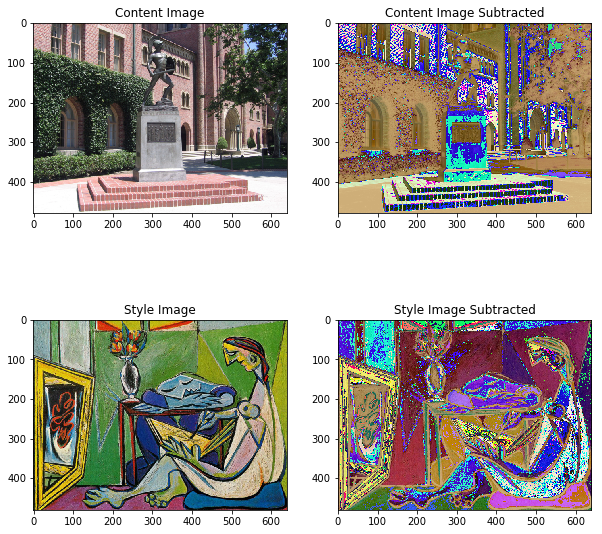

In [4]:
[content_image_raw, content_image] = load_image(CONTENT_IMAGE)
[style_image_raw, style_image] = load_image(STYLE_IMAGE)

fig = plt.figure(figsize=(10,10))   
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)

ax1.imshow(content_image_raw)
ax1.set_title('Content Image')
ax2.imshow(content_image)
ax2.set_title('Content Image Subtracted')
ax3.imshow(style_image_raw)
ax3.set_title('Style Image')
ax4.imshow(style_image)
ax4.set_title('Style Image Subtracted')

# Show the resulting image
plt.show()

## Random Image Generator

In [1]:
def generate_noise_image(content_image, noise_ratio):
    """
    Returns a noise image intermixed with the content image at a certain ratio.
    """
    noise_image = np.random.uniform(-20.0, 20.0, content_image.shape).astype('float32')
    #Take a weighted average of the values
    gen_image = noise_image * noise_ratio + content_image * (1.0 - noise_ratio)
    return gen_image

Now let's check by visualize images you generated. Keep in mind `noise_ratio = 0.0` produces the original subtracted image, while `noise_ratio = 1.0` produces a complete random noise.

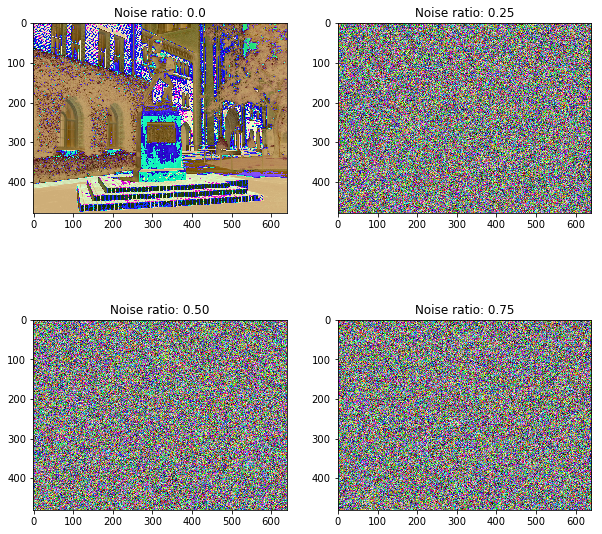

In [6]:
fig = plt.figure(figsize=(10,10))   
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)
gen_image = generate_noise_image(content_image, 0.0)
ax1.imshow(gen_image)
ax1.set_title('Noise ratio: 0.0')
gen_image = generate_noise_image(content_image, 0.25)
ax2.imshow(gen_image)
ax2.set_title('Noise ratio: 0.25')
gen_image = generate_noise_image(content_image, 0.50)
ax3.imshow(gen_image)
ax3.set_title('Noise ratio: 0.50')
gen_image = generate_noise_image(content_image, 0.75)
ax4.imshow(gen_image)
ax4.set_title('Noise ratio: 0.75')

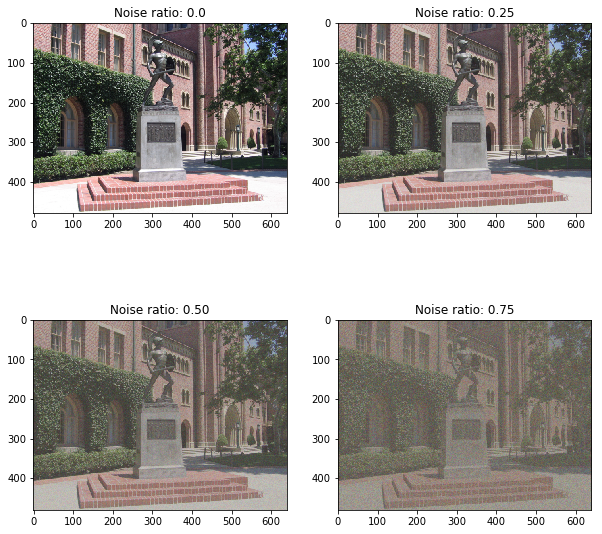

In [7]:
# Same as above. Since images were blur, I used the de-processed image
# fig = plt.figure(figsize=(10,10))   
# ax1 = plt.subplot(221)
# ax2 = plt.subplot(222)
# ax3 = plt.subplot(223)
# ax4 = plt.subplot(224)
# gen_image = recover_image(generate_noise_image(content_image, 0.0))
# ax1.imshow(gen_image)
# ax1.set_title('Noise ratio: 0.0')
# gen_image = recover_image(generate_noise_image(content_image, 0.25))
# ax2.imshow(gen_image)
# ax2.set_title('Noise ratio: 0.25')
# gen_image = recover_image(generate_noise_image(content_image, 0.50))
# ax3.imshow(gen_image)
# ax3.set_title('Noise ratio: 0.50')
# gen_image = recover_image(generate_noise_image(content_image, 0.75))
# ax4.imshow(gen_image)
# ax4.set_title('Noise ratio: 0.75')

### Content Loss
Then the content loss is given by:
$L_c = \frac{1}{2} \sum_{i,j} (F_{ij}^{\ell} - P_{ij}^{\ell})^2$

In [3]:
CONTENT_LAYER = 'conv4_2'

def content_loss_func(sess, model):
    """
    Content loss function as defined in the paper.
    """
    def _content_loss(current_feat, content_feat):
        """
        Inputs:
        - current_feat: features of the current image, Tensor with shape [1, height, width, channels]
        - content_feat: features of the content image, Tensor with shape [1, height, width, channels]

        Returns:
        - scalar content loss
        """
        loss = tf.nn.l2_loss(content_feat-current_feat)
        return loss
    return _content_loss(sess.run(model[CONTENT_LAYER]), model[CONTENT_LAYER])

### Style Loss

Now we can tackle the style loss of equation (5) from the paper. For a given layer $\ell$, the style loss is defined as follows:

First, compute the Gram matrix G which represents the correlations between the responses of each filter, where F is as above. The Gram matrix is an approximation to the covariance matrix -- we want the activation statistics of our generated image to match the activation statistics of our style image, and matching the (approximate) covariance is one way to do that. There are a variety of ways you could do this, but the Gram matrix is nice because it's easy to compute and in practice shows good results.

Given a feature map $F^\ell$ of shape $(1, M_\ell,  N_\ell)$, the Gram matrix has shape $(1, N_\ell, N_\ell)$ and its elements are given by:

$$G_{ij}^\ell  = \sum_k F^{\ell}_{ik} F^{\ell}_{jk}$$

Assuming $G^\ell$ is the Gram matrix from the feature map of the current image, $A^\ell$ is the Gram Matrix from the feature map of the source style image, then the style loss for the layer $\ell$ is simply the Euclidean distance between the two Gram matrices:

$$E_\ell = \frac{1}{4 N^2_\ell M^2_\ell} \sum_{i, j} \left(G^\ell_{ij} - A^\ell_{ij}\right)^2$$

In practice we usually compute the style loss at a set of layers $\mathcal{L}$ rather than just a single layer $\ell$; then the total style loss is the weighted sum of style losses at each layer by $w_\ell$:

$$L_s = \sum_{\ell \in \mathcal{L}}  w_\ell E_\ell$$

In our case it is a summation from conv1_1 (lower layer) to conv5_1 (higher layer). Intuitively, the style loss across multiple layers captures lower level features (hard strokes, points, etc) to higher level features (styles, patterns, even objects). 

In [8]:
# Layers to use. We will use these layers as advised in the paper.
# To have softer features, increase the weight of the higher layers
# (conv5_1) and decrease the weight of the lower layers (conv1_1).
# To have harder features, decrease the weight of the higher layers
# (conv5_1) and increase the weight of the lower layers (conv1_1).
STYLE_LAYERS = [
    ('conv1_1', 0.5),
    ('conv2_1', 0.5),
    ('conv3_1', 0.5),
    ('conv4_1', 0.5),
    ('conv5_1', 0.5),
]

def style_loss_func(sess, model):
    """
    Style loss function as defined in the paper.
    """
    def _gram_matrix(feat):
        """
        Compute the Gram matrix from features.

        Inputs:
        - feat: Tensor of shape (1, H, W, C) giving features for a single image.

        Returns:
        - gram: Tensor of shape (C, C) giving the (optionally normalized) Gram matrices for the input image.
        """
        N = tf.cast(feat.shape[3], dtype = tf.int32)
        M = tf.cast(feat.shape[1] * feat.shape[2], dtype=tf.int32)
        F = tf.reshape(feat, [M,N])
        gram = tf.matmul(tf.transpose(F), F)
        return gram
    
    
    def _gram_matrix_np(feat):
        feat = feat.reshape(feat.shape[1]*feat.shape[2], feat.shape[3])
        gram = np.dot(feat.T, feat)
        return gram

    def _style_loss(current_feat, style_feat):
        """
        Inputs:
        - current_feat: features of the current image, Tensor with shape [1, height, width, channels]
        - style_feat: features of the style image, Tensor with shape [1, height, width, channels]

        Returns:
        - scalar style loss
        """
        assert (current_feat.shape == style_feat.shape)

        M = current_feat.shape[1]*current_feat.shape[2]
        N = current_feat.shape[3]
        A = _gram_matrix_np(current_feat)
        G = _gram_matrix(style_feat)
        loss = (1./(4 * N**2 * M**2)) * tf.reduce_sum(tf.pow((G - A),2))
        return loss

    E = [_style_loss(sess.run(model[layer_name]), model[layer_name]) for layer_name, _ in STYLE_LAYERS]
    print(sess.run(E))
    W = [w for _, w in STYLE_LAYERS]
    loss = sum([W[l] * E[l] for l in range(len(STYLE_LAYERS))])
    return loss

Create an TensorFlow session.

In [9]:
sess = tf.InteractiveSession()

In [10]:
# Load VGG model
model = load_vgg_model(VGG_MODEL)

Build the model now.

In [11]:
# Construct content_loss using content_image.
content_image_list = np.reshape(content_image, ((1,) + content_image.shape))
sess.run(model['input'].assign(content_image_list))
content_loss = content_loss_func(sess, model)

In [12]:
# Construct style_loss using style_image.
style_image_list = np.reshape(style_image, ((1,) + style_image.shape))
sess.run(model['input'].assign(style_image_list))
style_loss = style_loss_func(sess, model)

[1.1286667e-07, 1.0802463e-05, 1.6615089e-06, 2.5585259e-05, 1.3488488e-10]


### Total loss
$$L = \alpha L_c + \beta L_s$$

In [13]:
# Constant to put more emphasis on content loss.
ALPHA = 0.0025
# Constant to put more emphasis on style loss.
BETA = 1
# Instantiate equation 7 of the paper.
total_loss = ALPHA * content_loss + BETA * style_loss

In [14]:
# We minimize the total_loss, which is the equation 7.
optimizer = tf.train.AdamOptimizer(2.0)
train_step = optimizer.minimize(total_loss)

## Finally! Run!

In [16]:
# Number of iterations to run.
ITERATIONS = 500

Iteration 0
cost:  1.19768e+09


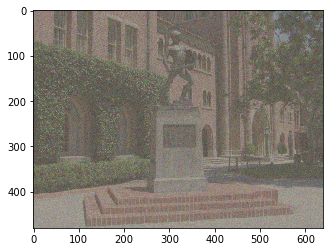

Iteration 50
cost:  1.89066e+08


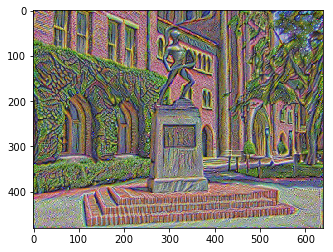

Iteration 100
cost:  1.38567e+08


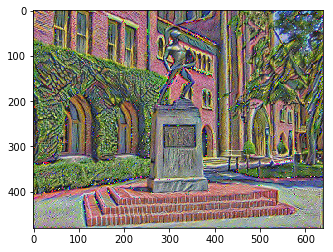

Iteration 150
cost:  1.23566e+08


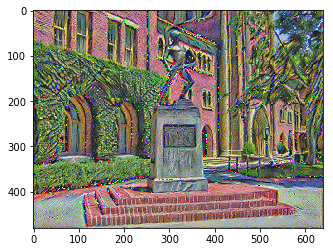

Iteration 200
cost:  1.16645e+08


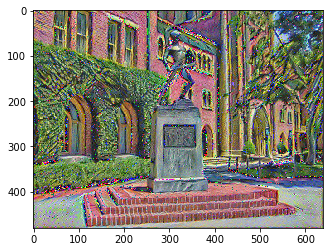

Iteration 250
cost:  1.12626e+08


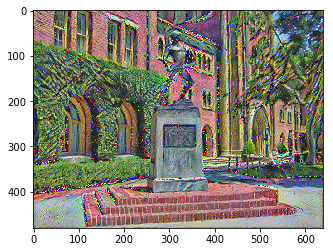

Iteration 300
cost:  1.09973e+08


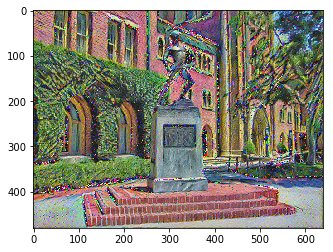

Iteration 350
cost:  1.08077e+08


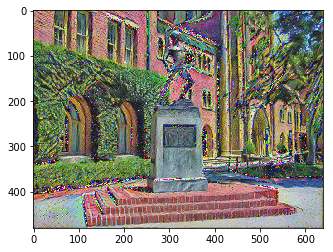

Iteration 400
cost:  1.06637e+08


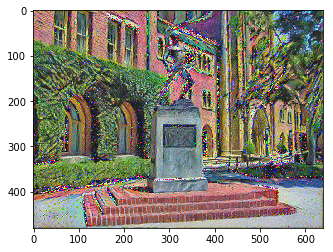

Iteration 450
cost:  1.055e+08


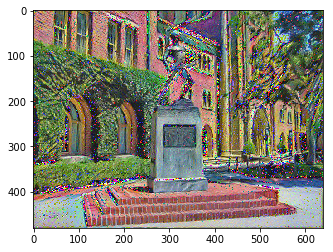

In [17]:
sess.run(tf.global_variables_initializer())
input_image = np.reshape(gen_image, ((1,) + gen_image.shape))
sess.run(model['input'].assign(input_image))
for it in range(ITERATIONS):
    sess.run(train_step)
    if it%50 == 0:
        # Print every 100 iteration.
        mixed_image = sess.run(model['input'])
        print('Iteration %d' % (it))
        print('cost: ', sess.run(total_loss))

        if not os.path.exists(OUTPUT_DIR):
            os.mkdir(OUTPUT_DIR)

        filename = 'output/%d.png' % (it)
        save_image(filename, mixed_image[0])
        
        final_image = recover_image(mixed_image[0]);
        imshow(final_image)
        plt.show()

This is our final art for 500 iterations.

## Further Assessments
### Loss Function

Iteration 0
cost:  1.23137e+09


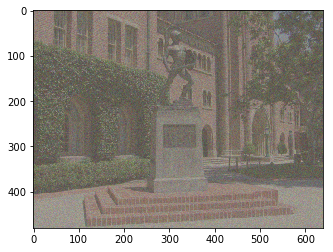

Iteration 50
cost:  4.14601e+08


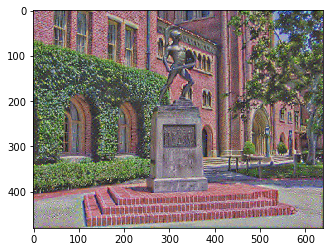

Iteration 100
cost:  3.81468e+08


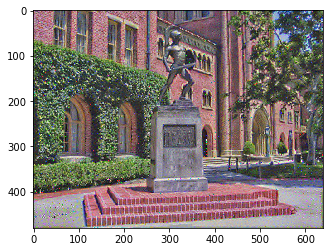

Iteration 150
cost:  3.68854e+08


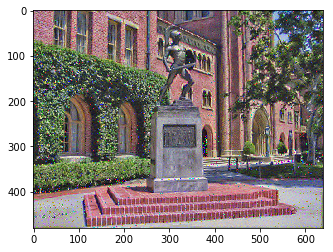

Iteration 200
cost:  3.6249e+08


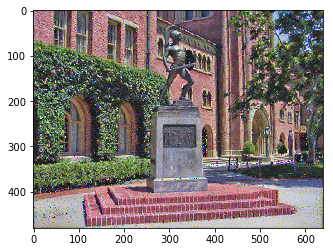

Iteration 250
cost:  3.5872e+08


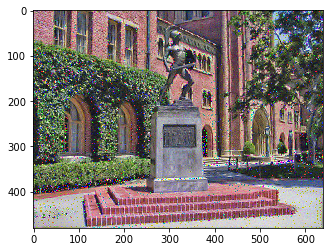

Iteration 300
cost:  3.5601e+08


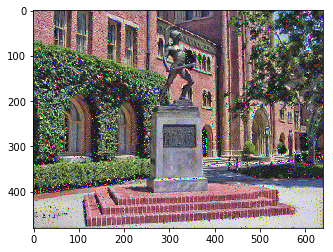

Iteration 350
cost:  3.54261e+08


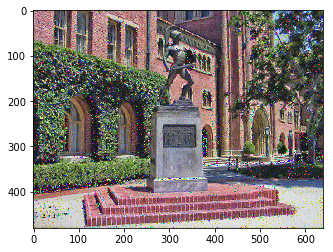

Iteration 400
cost:  3.52676e+08


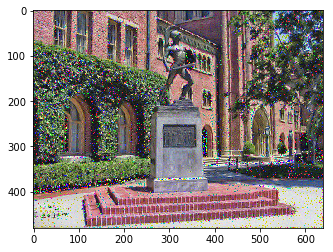

Iteration 450
cost:  3.51413e+08


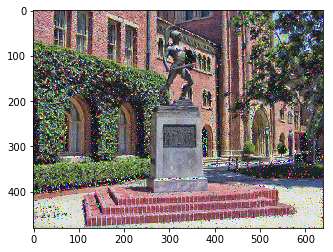

In [18]:
#############################################################################
# Changing Alpha value                          #
#############################################################################
ALPHA1 = 0.05
BETA1 = 1

# Instantiate equation 7 of the paper.
total_loss_1 = ALPHA1 * content_loss + BETA1 * style_loss
train_step_1 = optimizer.minimize(total_loss_1)

sess.run(tf.global_variables_initializer())
input_image = np.reshape(gen_image, ((1,) + gen_image.shape))
sess.run(model['input'].assign(input_image))
for it in range(ITERATIONS):
    sess.run(train_step_1)
    if it%50 == 0:
        # Print every 100 iteration.
        mixed_image = sess.run(model['input'])
        print('Iteration %d' % (it))
        print('cost: ', sess.run(total_loss))

        if not os.path.exists(OUTPUT_DIR):
            os.mkdir(OUTPUT_DIR)

        filename = 'output/%d.png' % (it)
        save_image(filename, mixed_image[0])
        
        final_image = recover_image(mixed_image[0]);
        imshow(final_image)
        plt.show()

Alpha and Beta parameters factorize the variation in the content of an image and the variation in its performance. Increasing the ratio of Alpha and Beta parameters will place strong emphasis on content, increasing the clarity of the photograph. Decreasing the ratio of alpha and beta parameters will place more emphasis on style matching the performance of the artwork, but photograph's content gradually diminishes and we will not able to see the content of the photograph appropriately.

### Layer's Hidden Information 

In [ ]:
#############################################################################
# Changing CONTENT_LAYER to one of the conv layers before conv4         #
#############################################################################
CONTENT_LAYER = 'conv3_2' # for example

content_loss_2 = content_loss_func(sess, model)
total_loss_2 = ALPHA * content_loss_2 + BETA * style_loss
train_step_2 = optimizer.minimize(total_loss_2)
sess.run(tf.global_variables_initializer())
input_image = np.reshape(gen_image, ((1,) + gen_image.shape))
sess.run(model['input'].assign(input_image))
for it in range(ITERATIONS):
    sess.run(train_step_2)
    if it%50 == 0:
        # Print every 100 iteration.
        mixed_image = sess.run(model['input'])
        print('Iteration %d' % (it))
        print('cost: ', sess.run(total_loss))

        if not os.path.exists(OUTPUT_DIR):
            os.mkdir(OUTPUT_DIR)

        filename = 'output/%d.png' % (it)
        save_image(filename, mixed_image[0])
        
        final_image = recover_image(mixed_image[0]);
        imshow(final_image)
        plt.show()

#### Ans: Low layers in the network represents the detailed pixel information. In low layers, reception of the filter will be smaller  which looks for texture and edge features. As we increase the depth, reception area of the filter increases giving better representation of the content in terms of objects and their arrangement in the input image. 

[1.5913317e-07, 1.3837751e-05, 1.4168909e-06, 2.9444434e-05, 1.2135301e-10]
Iteration 0
cost:  1.1968e+09


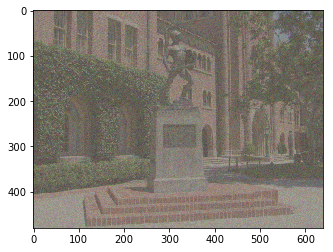

Iteration 50
cost:  2.19923e+08


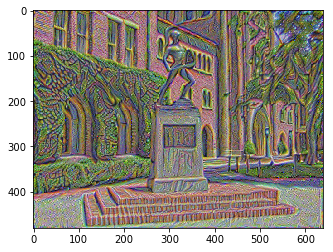

Iteration 100
cost:  1.58875e+08


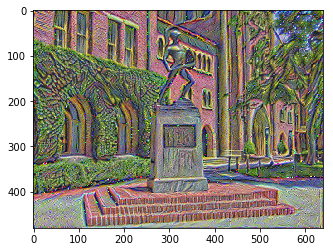

Iteration 150
cost:  1.38e+08


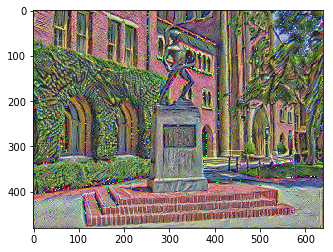

Iteration 200
cost:  1.28322e+08


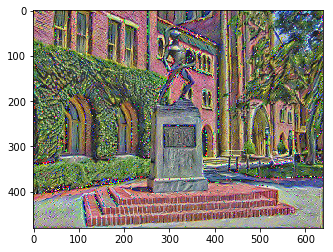

Iteration 250
cost:  1.22701e+08


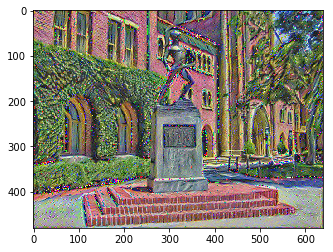

Iteration 300
cost:  1.19116e+08


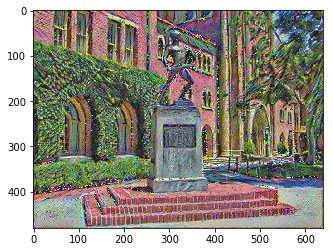

Iteration 350
cost:  1.16557e+08


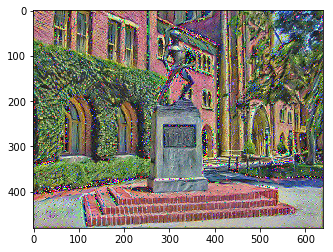

Iteration 400
cost:  1.14628e+08


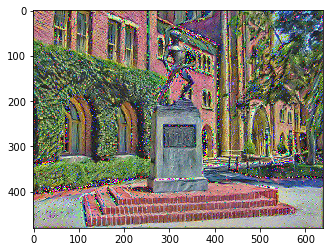

Iteration 450
cost:  1.13158e+08


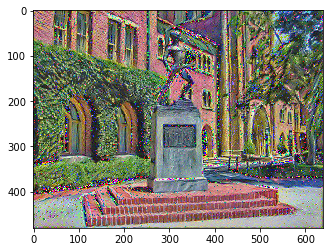

In [20]:
#############################################################################
# Change STYLE_LAYERS                                                 #
#############################################################################
ITERATIONS_3 = 500
STYLE_LAYERS = [ # for example
    ('conv1_1', 0.4),
    ('conv2_1', 0.6),
    ('conv3_1', 0.8),
    ('conv4_1', 1.0),
    ('conv5_1', 1.1),
]

style_loss_3 = style_loss_func(sess, model)
total_loss_3 = ALPHA * content_loss + BETA * style_loss_3
train_step_3 = optimizer.minimize(total_loss_3)
sess.run(tf.global_variables_initializer())
input_image = np.reshape(gen_image, ((1,) + gen_image.shape))
sess.run(model['input'].assign(input_image))
for it in range(ITERATIONS_3):
    sess.run(train_step_3)
    if it%(ITERATIONS / 10) == 0:
        # Print every 100 iteration.
        mixed_image = sess.run(model['input'])
        print('Iteration %d' % (it))
        print('cost: ', sess.run(total_loss))

        if not os.path.exists(OUTPUT_DIR):
            os.mkdir(OUTPUT_DIR)

        filename = 'output/%d.png' % (it)
        save_image(filename, mixed_image[0])
        
        final_image = recover_image(mixed_image[0]);
        imshow(final_image)
        plt.show()

### Relation between weights of the layers and the style information they represent. 
#### As we increase the weights of the higher layers in the network, local image structures are matched on increasingly larger scale, leading to a smoother and more continous visual experience. Visually most appealing images are created by giving more weightage to the style representation upto the highest layers in the network. Increasing the weights of lower layers will give more harder style representation reducing the visualization clarity of the photograph.

###  Functions of each conv layer inside of a CNN network.
#### Lower layers learns pixel level details such as texture representation suitable for style reconstruction. Higher layers learns more explicit representation of objects suitable for content reconstruction. Reconstruction of an image from conv1, conv2, conv3 gives almost perfect replica of the input image whereas in conv4 and conv5 detailed pixel information is lost but still preserves high level content of the image. While computing correlation between feature maps for style reconstruction, adding more weightage on conv4 and conv5 carries more smoother features.